# Procesamiento Digital de Imágenes
## Guía de Trabajos Prácticos 2 — Operaciones Puntuales y Manejo de Histogramas
**FICH, UNL — Ingeniería Informática**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from google.colab import output
output.enable_custom_widget_manager()

import os

ruta = '/content/drive/MyDrive/Practica PDI - Santiago Bargas/Practica 1'
os.chdir(ruta)

print("Archivos en la carpeta:")
for f in os.listdir(ruta):
    print(f" ·", f)

---
## TP2 — Ejercicio 1: Transformaciones Lineales (`s = a·r + c`)

La LUT (Look-Up Table) pre-calcula el mapeo para cada uno de los 256 niveles de intensidad, evitando recalcular la ecuación píxel a píxel.

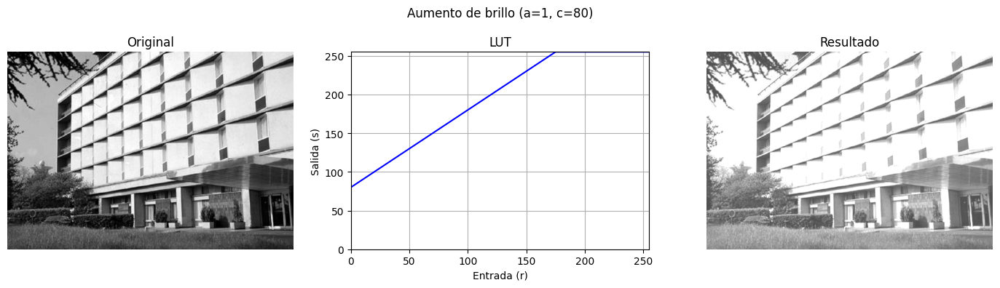

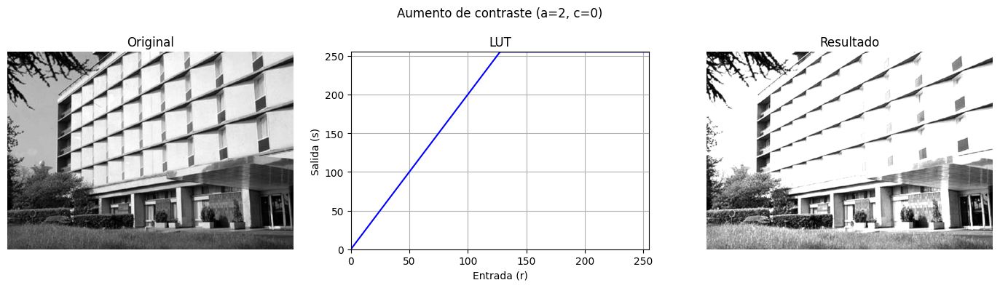

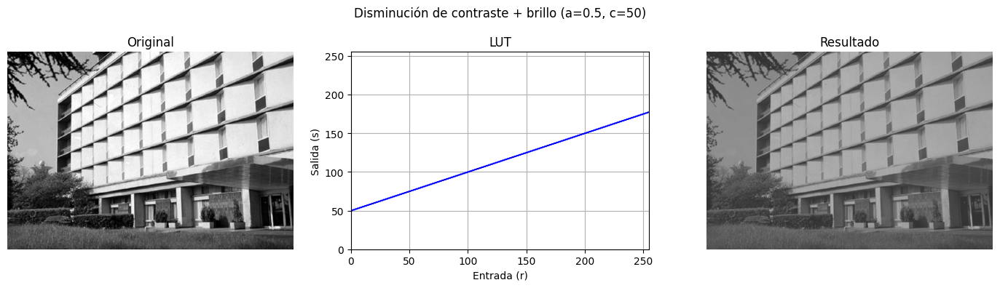

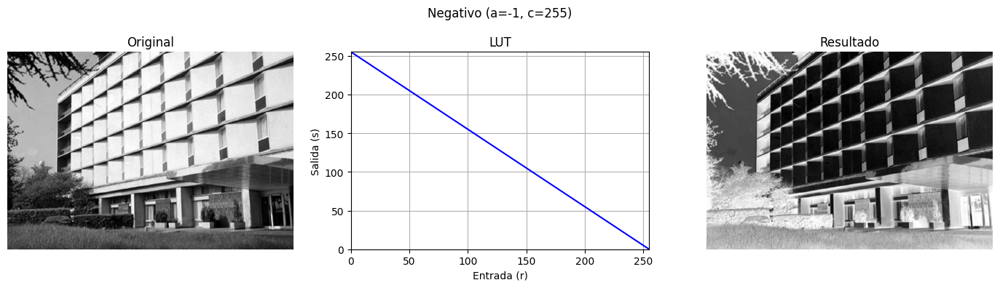

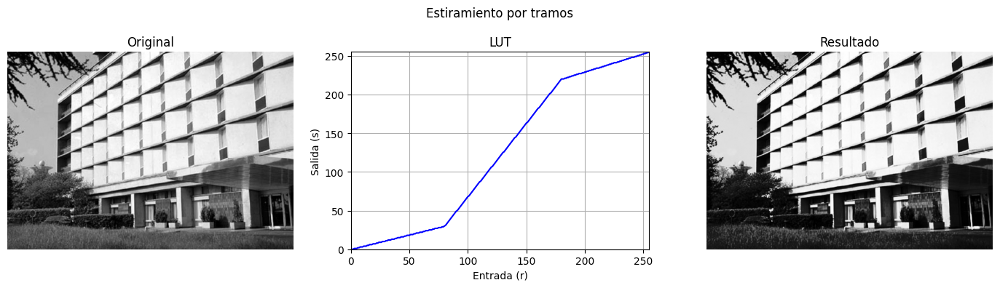

In [3]:
# Dependencias — descomentar si hace falta
# !pip install opencv-python numpy matplotlib ipywidgets

import cv2
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output
import os

def generar_lut_lineal(a, c):
    """s = a*r + c, recortado a [0, 255]"""
    r = np.arange(256)
    return np.clip(a * r + c, 0, 255).astype(np.uint8)

def generar_lut_tramos(puntos_x, puntos_y):
    """Interpolación lineal entre puntos de ruptura."""
    r = np.arange(256)
    return np.clip(np.interp(r, puntos_x, puntos_y), 0, 255).astype(np.uint8)

def mostrar_lut(img_gray, lut, titulo):
    img_res = cv2.LUT(img_gray, lut)
    fig, axs = plt.subplots(1, 3, figsize=(14, 4))
    fig.suptitle(titulo, fontsize=12)
    axs[0].imshow(img_gray, cmap='gray', vmin=0, vmax=255); axs[0].set_title('Original');  axs[0].axis('off')
    axs[1].plot(lut, color='blue'); axs[1].set_title('LUT'); axs[1].set_xlabel('Entrada (r)'); axs[1].set_ylabel('Salida (s)')
    axs[1].set_xlim([0,255]); axs[1].set_ylim([0,255]); axs[1].grid(True)
    axs[2].imshow(img_res, cmap='gray', vmin=0, vmax=255); axs[2].set_title('Resultado'); axs[2].axis('off')
    plt.tight_layout(); plt.show()

img = cv2.imread('building.jpg', cv2.IMREAD_GRAYSCALE)

if img is None:
    print('No se encontró building.jpg — ajustá RUTA_IMG al inicio.')
else:
    pruebas = [
        (1.0,  80,  'Aumento de brillo (a=1, c=80)'),
        (2.0,   0,  'Aumento de contraste (a=2, c=0)'),
        (0.5,  50,  'Disminución de contraste + brillo (a=0.5, c=50)'),
        (-1.0, 255, 'Negativo (a=-1, c=255)'),
    ]
    for a, c, titulo in pruebas:
        mostrar_lut(img, generar_lut_lineal(a, c), titulo)

    # Transformación por tramos
    lut_tramos = generar_lut_tramos([0, 80, 180, 255], [0, 30, 220, 255])
    mostrar_lut(img, lut_tramos, 'Estiramiento por tramos')

---
## TP2 — Ejercicio 2: Transformaciones No Lineales

- **Logarítmica** `s = c·log(1+r)`: expande los grises oscuros, comprime los brillantes.
- **Potencia / Gamma** `s = r^γ`: γ < 1 aclara (similar a log), γ > 1 oscurece.

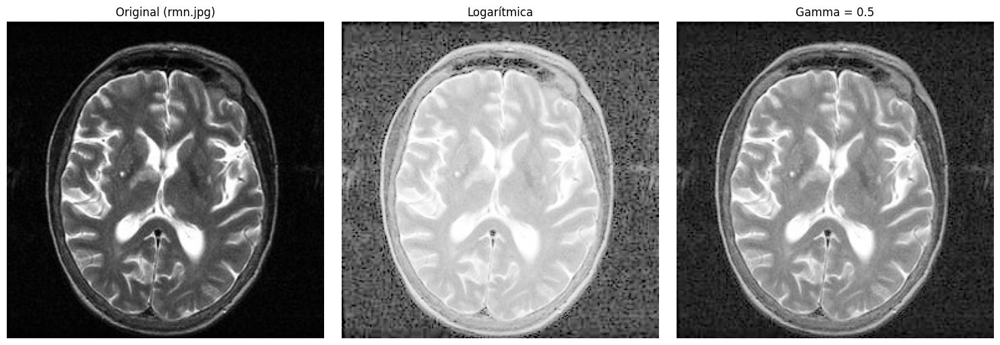

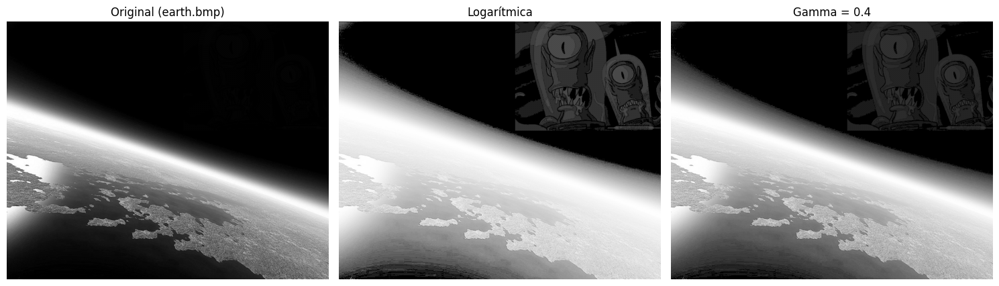

In [5]:
def transformaciones_no_lineales(ruta, gamma=0.5):
    img = cv2.imread(ruta, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f'No se encontró {ruta}'); return

    img_f = img.astype(np.float32)

    # Logarítmica
    c_log = 255.0 / np.log(1 + np.max(img_f))
    img_log = np.clip(c_log * np.log(1 + img_f), 0, 255).astype(np.uint8)

    # Gamma
    img_gamma = np.clip((img_f / 255.0) ** gamma * 255.0, 0, 255).astype(np.uint8)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    nombre = ruta.split('/')[-1]
    axs[0].imshow(img, cmap='gray');     axs[0].set_title(f'Original ({nombre})')
    axs[1].imshow(img_log, cmap='gray'); axs[1].set_title('Logarítmica')
    axs[2].imshow(img_gamma, cmap='gray'); axs[2].set_title(f'Gamma = {gamma}')
    for ax in axs: ax.axis('off')
    plt.tight_layout(); plt.show()

transformaciones_no_lineales('rmn.jpg',   gamma=0.5)
transformaciones_no_lineales('earth.bmp', gamma=0.4)

---
## TP2 — Ejercicio 3: Operaciones Aritméticas

### 3a — Suma, Resta y Multiplicación

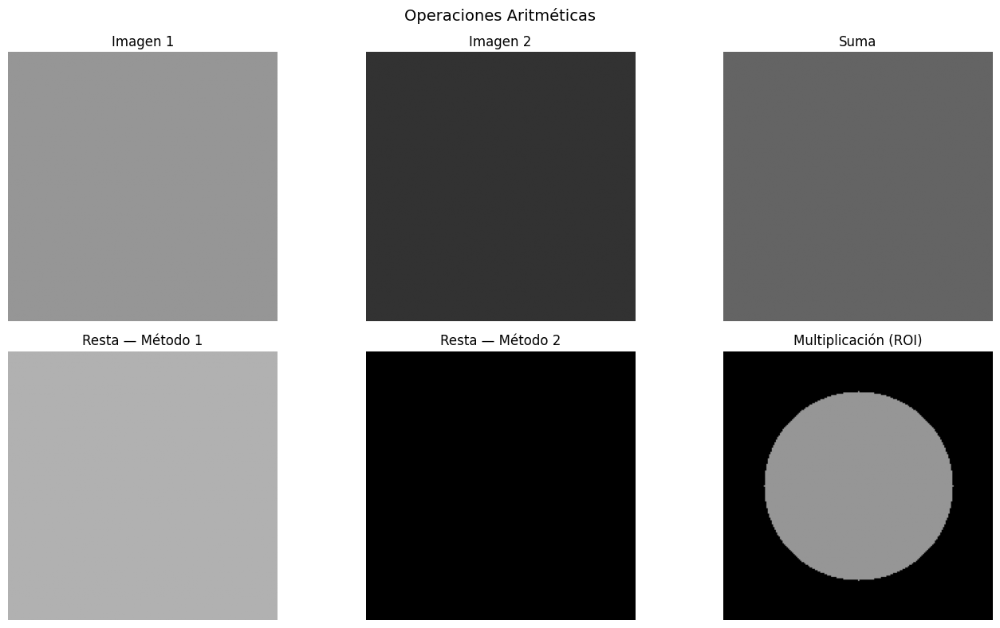

In [6]:
def operaciones_aritmeticas(img1, img2, mascara):
    f1 = img1.astype(np.float32)
    f2 = img2.astype(np.float32)

    suma = ((f1 + f2) / 2.0).astype(np.uint8)

    diff = f1 - f2
    diff_m1 = ((diff + 255) / 2.0).astype(np.uint8)                      # Método 1
    diff_m2 = diff - diff.min()
    if diff_m2.max() != 0: diff_m2 = (diff_m2 * 255.0 / diff_m2.max()).astype(np.uint8)
    else: diff_m2 = diff_m2.astype(np.uint8)                              # Método 2

    mult = (f1 * (mascara / 255.0)).astype(np.uint8)

    fig, axs = plt.subplots(2, 3, figsize=(14, 8))
    fig.suptitle('Operaciones Aritméticas', fontsize=14)
    datos = [
        (img1, 'Imagen 1'), (img2, 'Imagen 2'), (suma, 'Suma'),
        (diff_m1, 'Resta — Método 1'), (diff_m2, 'Resta — Método 2'), (mult, 'Multiplicación (ROI)'),
    ]
    for ax, (im, t) in zip(axs.flat, datos):
        ax.imshow(im, cmap='gray', vmin=0, vmax=255); ax.set_title(t); ax.axis('off')
    plt.tight_layout(); plt.show()

# Imágenes de prueba sintéticas
img_a = np.full((200, 200), 150, dtype=np.uint8)
img_b = np.full((200, 200),  50, dtype=np.uint8)
mascara = np.zeros((200, 200), dtype=np.uint8)
cv2.circle(mascara, (100, 100), 70, 255, -1)

operaciones_aritmeticas(img_a, img_b, mascara)

### 3b — Extracción de Fondo en Video

El fondo se obtiene **promediando N frames**: los objetos en movimiento son anomalías estadísticas que desaparecen al promediar.

In [7]:
ruta_video = 'pedestrians.mp4'
cap = cv2.VideoCapture(ruta_video)

if not cap.isOpened():
    print(f'No se encontró el video en {ruta_video}')
else:
    frames = []
    while cap.isOpened() and len(frames) < 100:
        ret, frame = cap.read()
        if not ret: break
        frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).astype(np.float32))
    cap.release()
    print(f'{len(frames)} frames cargados.')

    slider = widgets.IntSlider(value=1, min=1, max=len(frames), step=1,
                               description='N frames:', continuous_update=False,
                               layout=widgets.Layout(width='500px'))
    out = widgets.Output()

    def actualizar(change):
        n = slider.value
        fondo = (np.sum(frames[:n], axis=0) / n).astype(np.uint8)
        with out:
            clear_output(wait=True)
            plt.figure(figsize=(7, 4))
            plt.imshow(fondo, cmap='gray')
            plt.title(f'Fondo estimado con {n} frame(s)')
            plt.axis('off')
            plt.tight_layout()
            plt.show()

    slider.observe(actualizar, names='value')
    display(slider, out)
    actualizar(None)

100 frames cargados.


IntSlider(value=1, continuous_update=False, description='N frames:', layout=Layout(width='500px'), min=1)

Output()

---
## TP2 — Ejercicio 4: Aplicaciones

### 4.1 — Astronomía: revelar objetos ocultos en `earth.bmp`

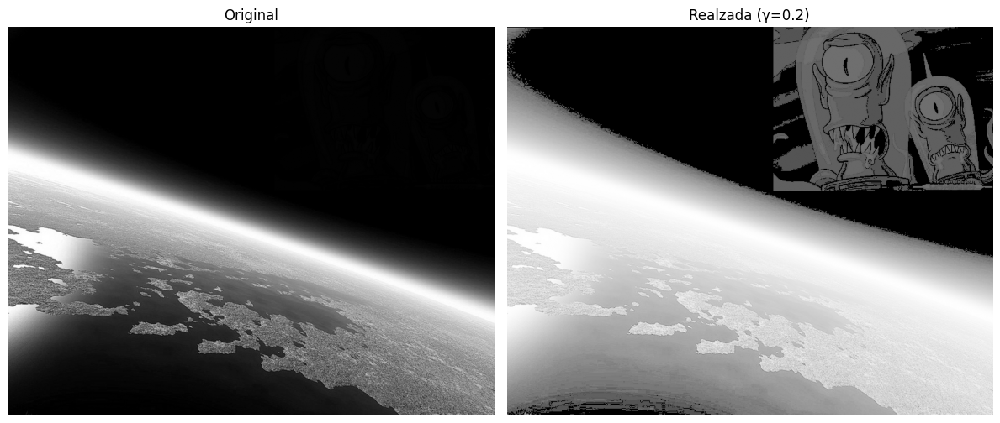

In [8]:
img = cv2.imread('earth.bmp', cv2.IMREAD_GRAYSCALE)

if img is None:
    print('No se encontró earth.bmp')
else:
    gamma = 0.2
    img_realzada = np.clip((img.astype(np.float32) / 255.0) ** gamma * 255.0, 0, 255).astype(np.uint8)

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    axs[0].imshow(img, cmap='gray', vmin=0, vmax=255); axs[0].set_title('Original')
    axs[1].imshow(img_realzada, cmap='gray', vmin=0, vmax=255); axs[1].set_title(f'Realzada (γ={gamma})')
    for ax in axs: ax.axis('off')
    plt.tight_layout(); plt.show()

### 4.2 — Clasificación de Placas ASUS (A7V600-x vs A7V600-SE)

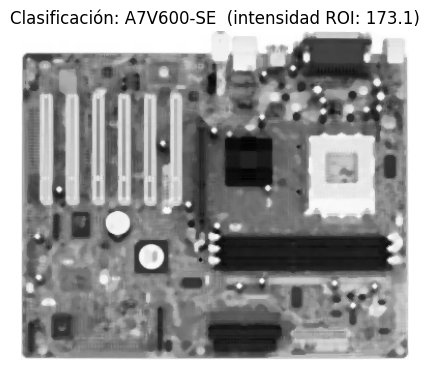

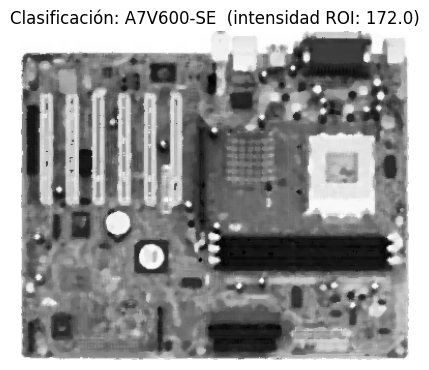

'A7V600-SE'

In [12]:
def clasificar_placa(ruta):
    img = cv2.imread(ruta, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f'No se encontró {ruta}'); return

    # Filtro de mediana para ruido impulsivo (sal y pimienta)
    img_proc = cv2.medianBlur(img, 5)

    # ROI donde difieren los modelos — ajustar coordenadas según imagen real
    roi = img_proc[100:200, 300:400]
    intensidad = np.mean(roi) if roi.size > 0 else 0
    modelo = 'A7V600-SE' if intensidad > 100 else 'A7V600-x'

    plt.figure(figsize=(5, 5))
    plt.imshow(img_proc, cmap='gray')
    plt.title(f'Clasificación: {modelo}  (intensidad ROI: {intensidad:.1f})')
    plt.axis('off'); plt.show()
    return modelo

clasificar_placa('a7v600-x.gif')
clasificar_placa('a7v600-SE(RImpulsivo).gif')

### 4.3 — Inspección de Blisters

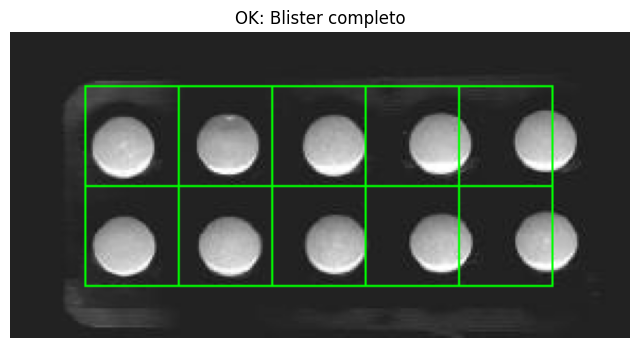

blister_incompleto.jpg — Posiciones faltantes: [(144, 95)]


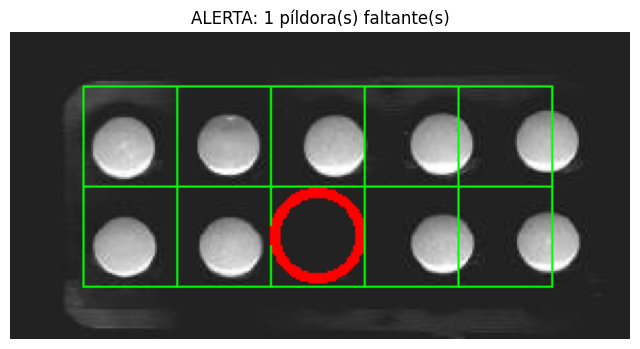

In [14]:
def inspeccionar_blister(ruta):
    img = cv2.imread(ruta, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f'No se encontró {ruta}'); return

    _, mascara = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)
    h, w = mascara.shape
    filas, cols = 2, 5
    mx, my = int(w * 0.12), int(h * 0.18)
    wc, hc = (w - 2*mx) // cols, (h - 2*my) // filas

    resultado = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    completo = True
    faltantes = []

    for i in range(filas):
        for j in range(cols):
            y0, y1 = my + i*hc, my + (i+1)*hc
            x0, x1 = mx + j*wc, mx + (j+1)*wc
            cv2.rectangle(resultado, (x0, y0), (x1, y1), (0, 255, 0), 1)
            celda = mascara[y0:y1, x0:x1]
            if cv2.countNonZero(celda) < hc * wc * 0.15:
                completo = False
                cx, cy = x0 + wc//2, y0 + hc//2
                faltantes.append((cx, cy))
                cv2.circle(resultado, (cx, cy), 20, (0, 0, 255), 3)

    titulo = 'OK: Blister completo' if completo else f'ALERTA: {len(faltantes)} píldora(s) faltante(s)'
    if not completo:
        print(f'{ruta.split("/")[-1]} — Posiciones faltantes: {faltantes}')

    plt.figure(figsize=(8, 4))
    plt.imshow(cv2.cvtColor(resultado, cv2.COLOR_BGR2RGB))
    plt.title(titulo); plt.axis('off'); plt.show()

inspeccionar_blister('blister_completo.jpg')
inspeccionar_blister('blister_incompleto.jpg')

---
## TP2b — Ejercicio 1: Manejo de Histogramas

### Carga y análisis de `patron.tif` y `patron2.tif`

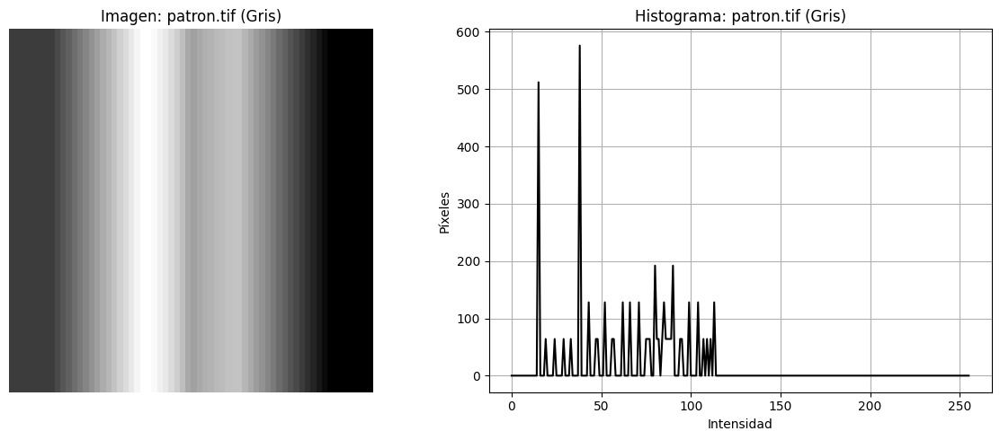

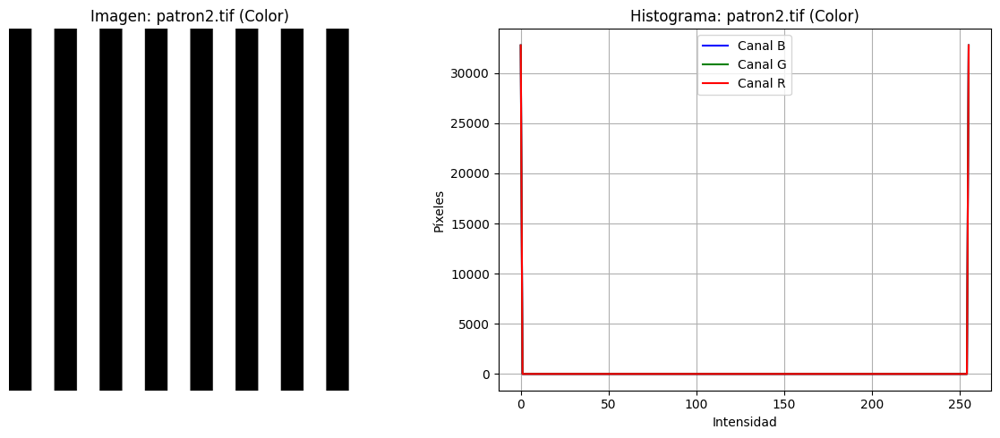

In [17]:
def analizar_imagen(img, titulo, es_color=False):
    if img is None:
        print(f'Error: no se pudo cargar {titulo}'); return
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if es_color else img, cmap=None if es_color else 'gray')
    plt.title(f'Imagen: {titulo}'); plt.axis('off')
    plt.subplot(1, 2, 2)
    if es_color:
        for i, col in enumerate(('b', 'g', 'r')):
            plt.plot(cv2.calcHist([img], [i], None, [256], [0, 256]), color=col, label=f'Canal {col.upper()}')
        plt.legend()
    else:
        plt.plot(cv2.calcHist([img], [0], None, [256], [0, 256]), color='black')
    plt.title(f'Histograma: {titulo}'); plt.xlabel('Intensidad'); plt.ylabel('Píxeles'); plt.grid(True)
    plt.tight_layout(); plt.show()

analizar_imagen(cv2.imread('patron.tif',  cv2.IMREAD_GRAYSCALE), 'patron.tif (Gris)')
analizar_imagen(cv2.imread('patron2.tif'), 'patron2.tif (Color)', es_color=True)

La imagen de patron.tif a simple vista es un degradado de colores pero al cargarla en escala de grises nos revela su estructura interna. 
En lugar de una montaña suave y continua vemos una serie de picos aislados, esto indica que la imagen no es un degradado analogico perfecto, sino que está compuesta por franjas de colores sólidos con saltos bruscos de intensidad
Intensidad de píxel de 0 a 120 aprox. Esto significa que, aunque vemos colores (rojo, verde, azul), su equivalencia en niveles de gris es bastante oscura. No hay blancos ni grises claros en esta conversión.
Expectativa vs. Realidad: Uno podría esperar un histograma plano (distribución uniforme), pero la realidad es que hay intensidades que se repiten mucho más que otras (los picos más altos).

La imagen de patron2.tif es un patrón de barras verticales (blanco y negro). El histograma nos dice cómo es una imagen de alto contraste:
Bimodalidad extrema: Solo vemos dos grandes picos. Uno en el nivel 0 (negro absoluto) y otro en el nivel 255 (blanco absoluto).
Superposición de canales: Los canales R, G y B están perfectamente solapados (la línea se ve roja porque es la última que se graficó).
Simetría: Los dos picos tienen una altura similar, lo que nos indica que la cantidad de píxeles negros es prácticamente igual a la cantidad de píxeles blancos (las barras tienen el mismo ancho).
Expectativa vs. Realidad: Aquí la realidad coincide al 100% con la expectativa: una imagen de barras B/N solo debe tener información en los extremos.


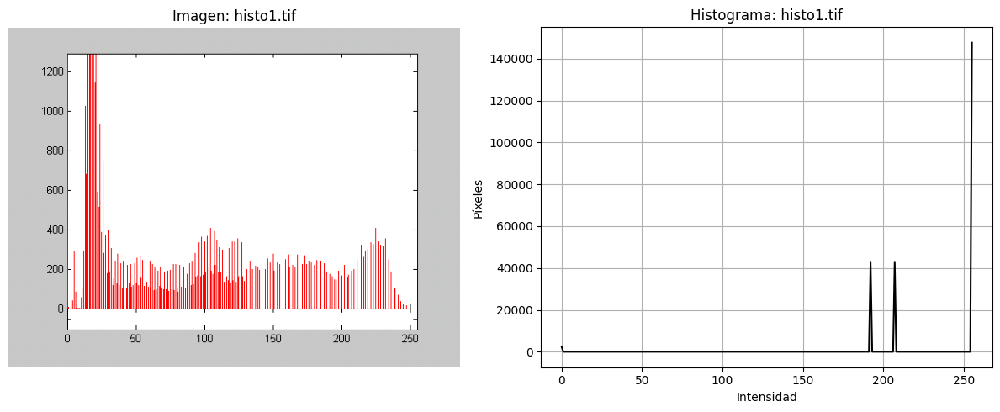

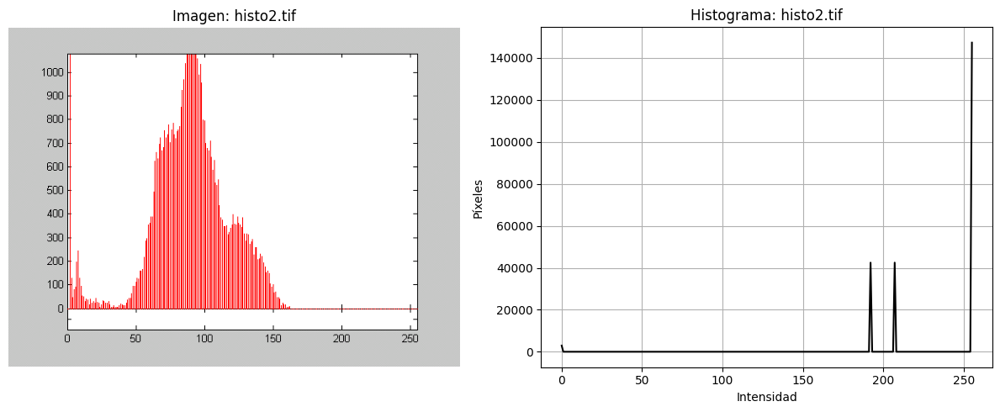

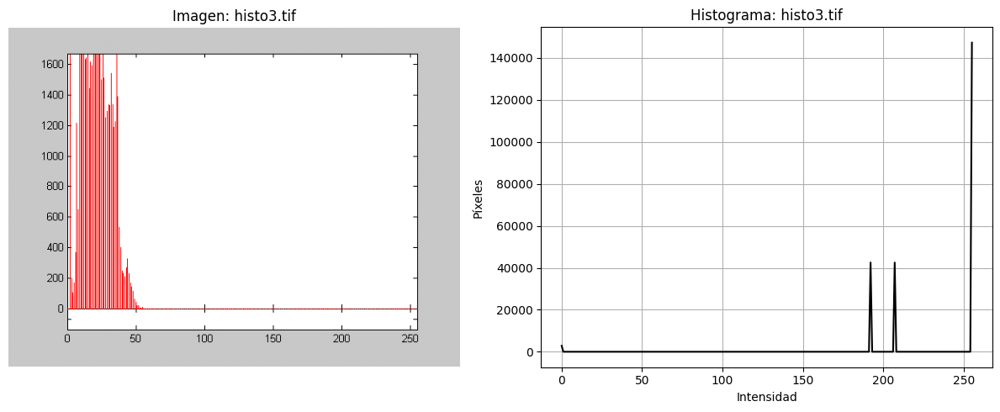

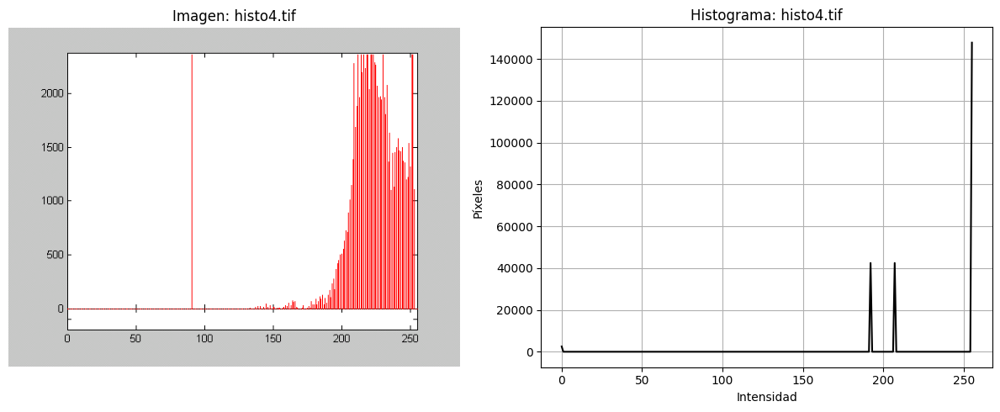

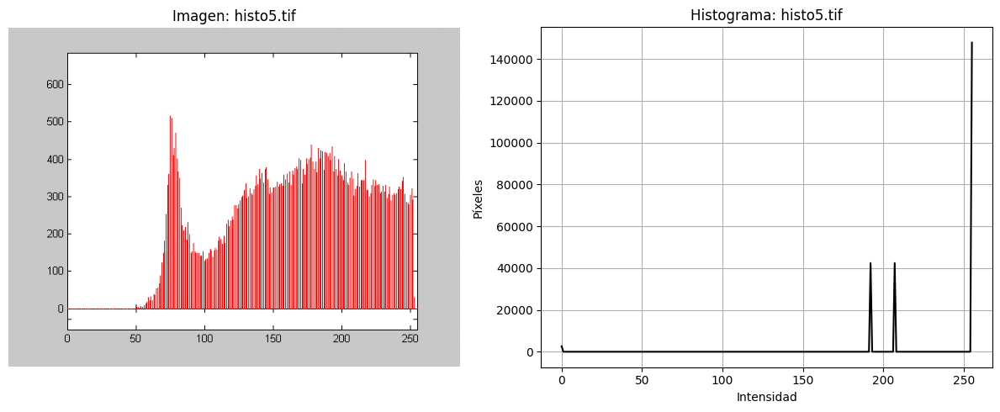

In [20]:
for i in range(1, 6):
    img_h = cv2.imread(f'histo{i}.tif')
    analizar_imagen(img_h, f'histo{i}.tif')

CLARA U OBSCURA
Si los picos estan a la izquierda -> oscura, predominan los negros
Si los picos estan a la derecha -> clara, predominan los blancos

CONTRASTE
Histograma angosto: Bajo contraste
Histograma ancho: Alto contraste

PICOS SOBRE LOS OBJETOS
Un solo pico la imagen es uniforme. Ej un cielo despejado
Dos picos separados, objeto claro sobre fondo oscuro
Histograma plano: mucha variedad de detalles

ESTADISTICAS DE LOS HISTOGRAMAS

Media -> Brillo
Varianza-> Contraste
Asimetria -> Asimetría positiva (la cola se extiende hacia los claros). La masa de la imagen es oscura. Asimetría negativa (la cola se extiende hacia los negros). La masa de la imagen es clara.
Energia -> que tan homogenea es la imagen
Entropia -> Entropia alta: Mucho detalle - Entropia Baja: poco detalle

### 1c — Correspondencia histograma ↔ imagen (`imagenA-E.tif`)

C:\Users\santi\AppData\Local\Temp\ipykernel_14308\506680838.py:8: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  plt.hist(img_r.ravel(), 256, [0, 256], color='red', histtype='step')


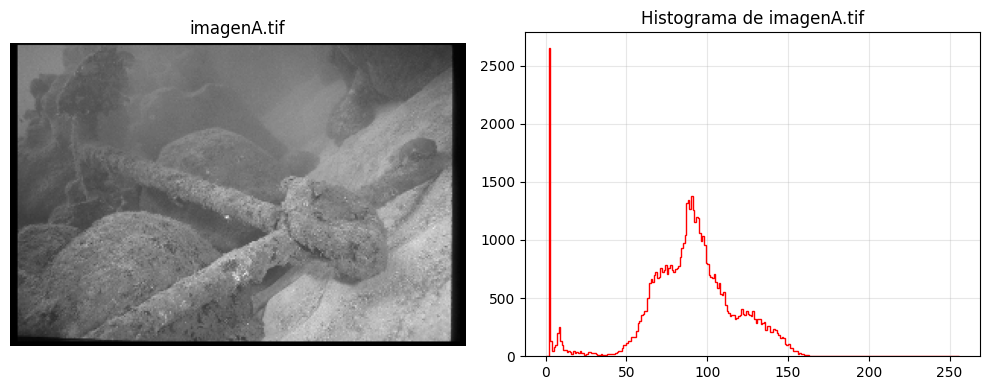

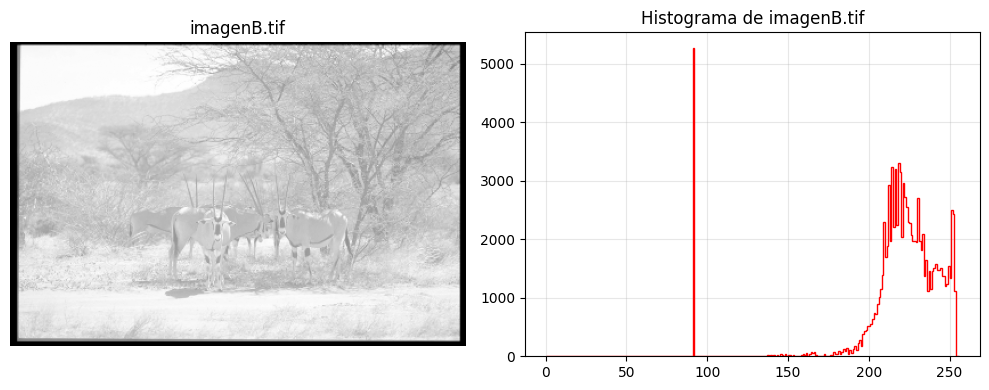

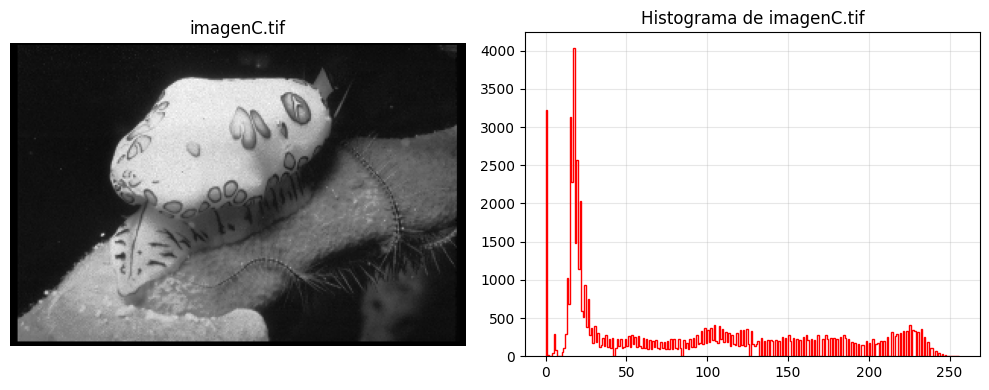

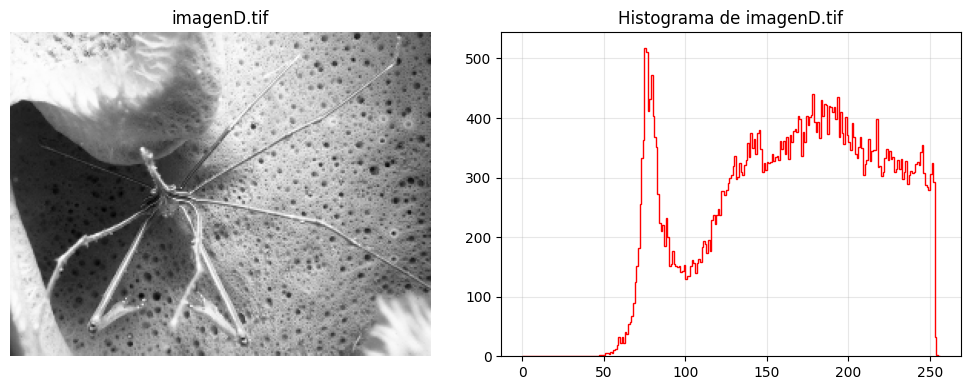

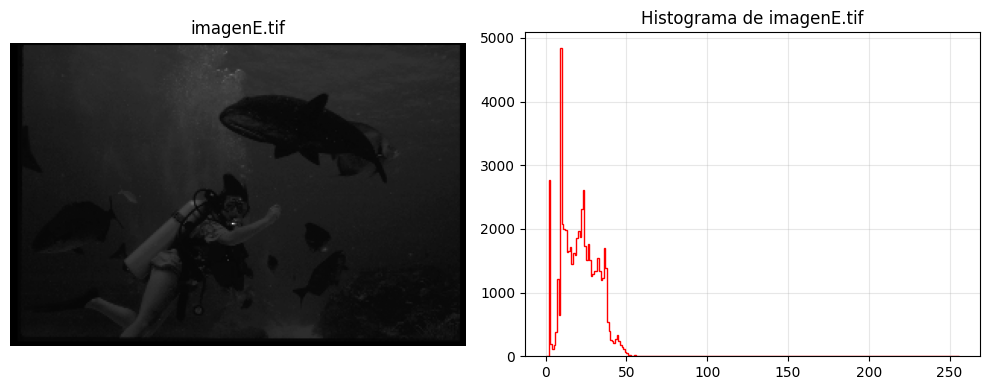

In [34]:
for letra in ('A', 'B', 'C', 'D', 'E'):
    img_r = cv2.imread(f'imagen{letra}.tif', cv2.IMREAD_GRAYSCALE)
    if img_r is None: continue
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_r, cmap='gray'); plt.title(f'imagen{letra}.tif'); plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.hist(img_r.ravel(), 256, [0, 256], color='red', histtype='step')
    plt.title(f'Histograma de imagen{letra}.tif'); plt.grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()

### 1d — Estadísticas del histograma

| Estadística | Qué mide |
|---|---|
| **Media** | Brillo general |
| **Varianza** | Contraste macroscópico |
| **Asimetría** | Dominancia de sombras (>0) o luces (<0) |
| **Energía** | Concentración tonal (imagen uniforme → energía alta) |
| **Entropía** | Riqueza de información (textura compleja → entropía alta) |

In [35]:
def calcular_estadisticas(img):
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    p = hist.flatten() / img.size
    L = np.arange(256)
    media    = np.sum(L * p)
    varianza = np.sum((L - media)**2 * p)
    std      = np.sqrt(varianza)
    asimetria = np.sum((L - media)**3 * p) / (std**3 + 1e-6)
    energia  = np.sum(p**2)
    entropia = -np.sum(p * np.log2(p + 1e-10))
    return media, varianza, asimetria, energia, entropia

for letra in ('A', 'B', 'C', 'D', 'E'):
    img_r = cv2.imread(f'imagen{letra}.tif', cv2.IMREAD_GRAYSCALE)
    if img_r is None: continue
    m, v, asim, en, ent = calcular_estadisticas(img_r)
    print(f'imagen{letra}.tif — Media: {m:.1f} | Varianza: {v:.1f} | Asimetría: {asim:.2f} | Energía: {en:.5f} | Entropía: {ent:.2f}')

imagenA.tif — Media: 87.2 | Varianza: 1010.4 | Asimetría: -0.79 | Energía: 0.01327 | Entropía: 6.59
imagenB.tif — Media: 218.2 | Varianza: 1089.4 | Asimetría: -2.74 | Energía: 0.02022 | Entropía: 5.86
imagenC.tif — Media: 77.7 | Varianza: 5079.1 | Asimetría: 0.79 | Energía: 0.01895 | Entropía: 6.74
imagenD.tif — Media: 165.9 | Varianza: 2663.7 | Asimetría: -0.24 | Energía: 0.00572 | Entropía: 7.51
imagenE.tif — Media: 20.9 | Varianza: 114.6 | Asimetría: 0.34 | Energía: 0.03184 | Entropía: 5.20


### 1e — Ecualización Global de Histograma

`cv2.equalizeHist` mapea la intensidad más oscura → 0 y la más brillante → 255, distribuyendo el resto mediante la CDF. En imágenes discretas aparecen huecos y picos residuales porque los píxeles no pueden fraccionarse.

C:\Users\santi\AppData\Local\Temp\ipykernel_14308\215826271.py:9: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  axs[1,0].hist(img.ravel(), 256, [0,256], color='black', alpha=0.7); axs[1,0].set_title('Histograma Original'); axs[1,0].grid(True, alpha=0.3)
C:\Users\santi\AppData\Local\Temp\ipykernel_14308\215826271.py:10: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.10; the parameter will become keyword-only in 3.12.
  axs[1,1].hist(equ.ravel(), 256, [0,256], color='blue',  alpha=0.7); axs[1,1].set_title('Histograma Ecualizado'); axs[1,1].grid(True, alpha=0.3)


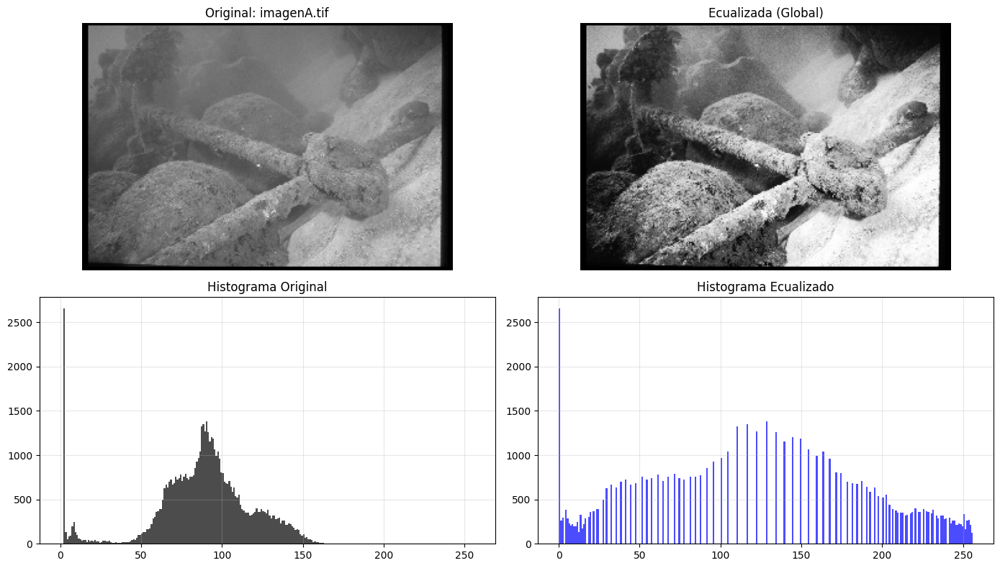

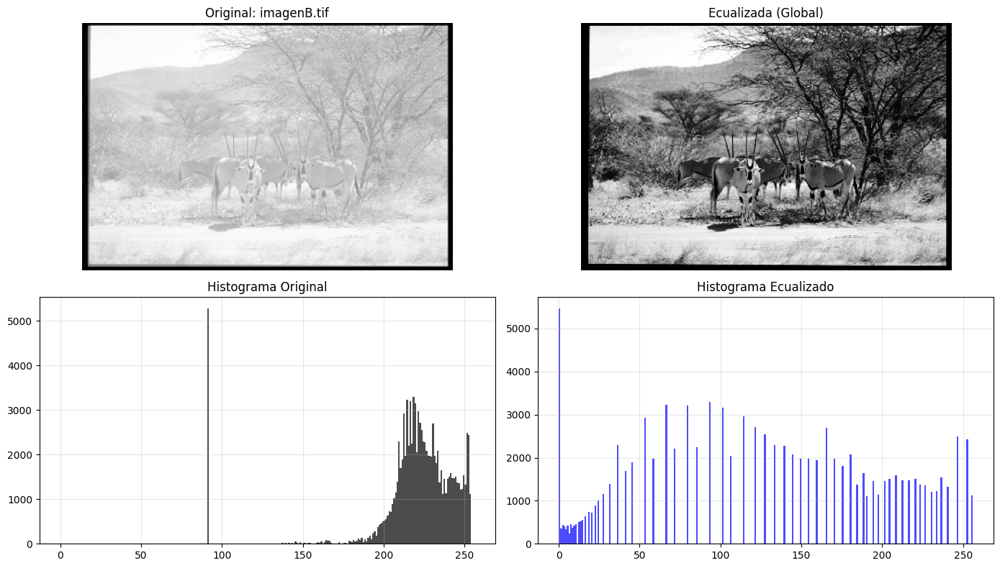

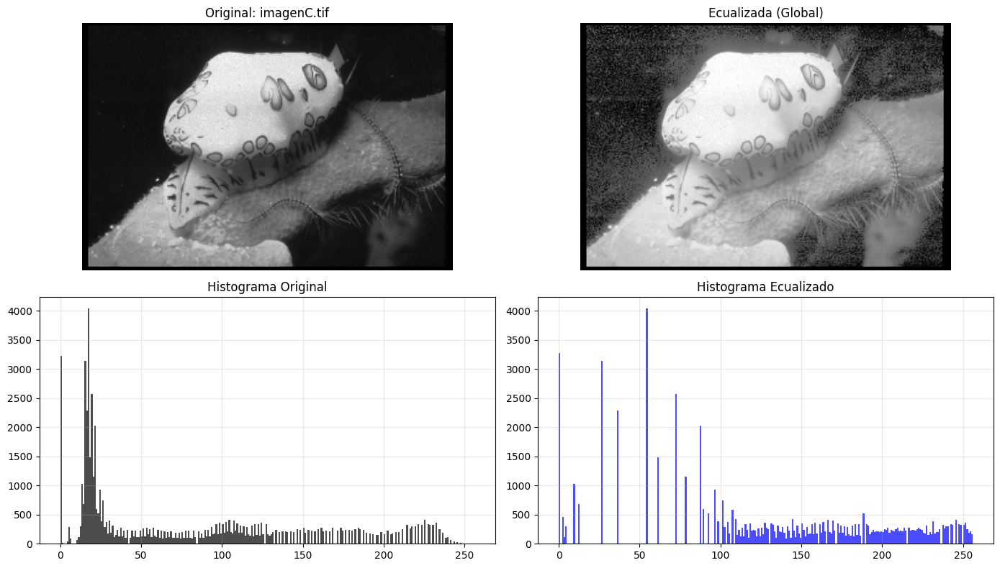

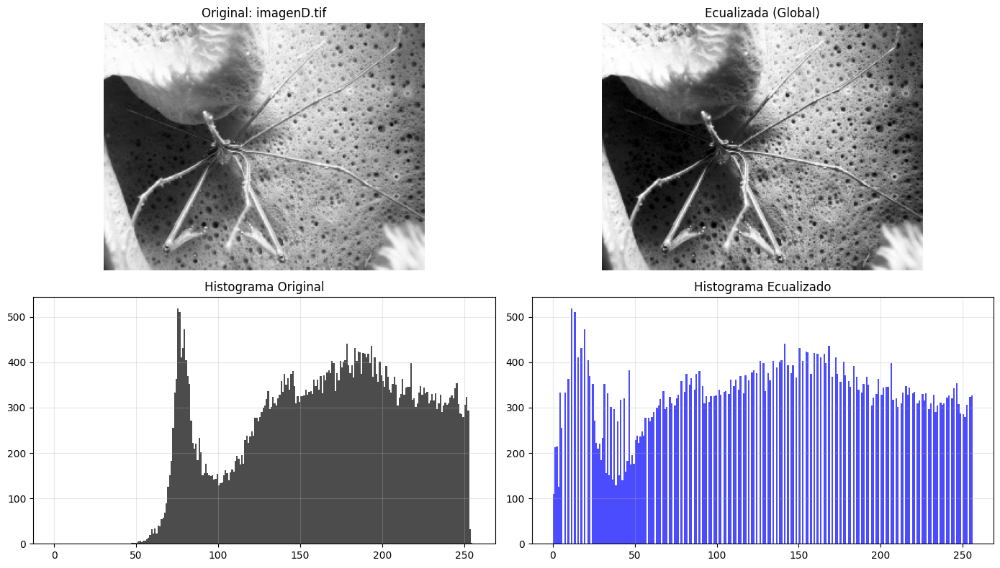

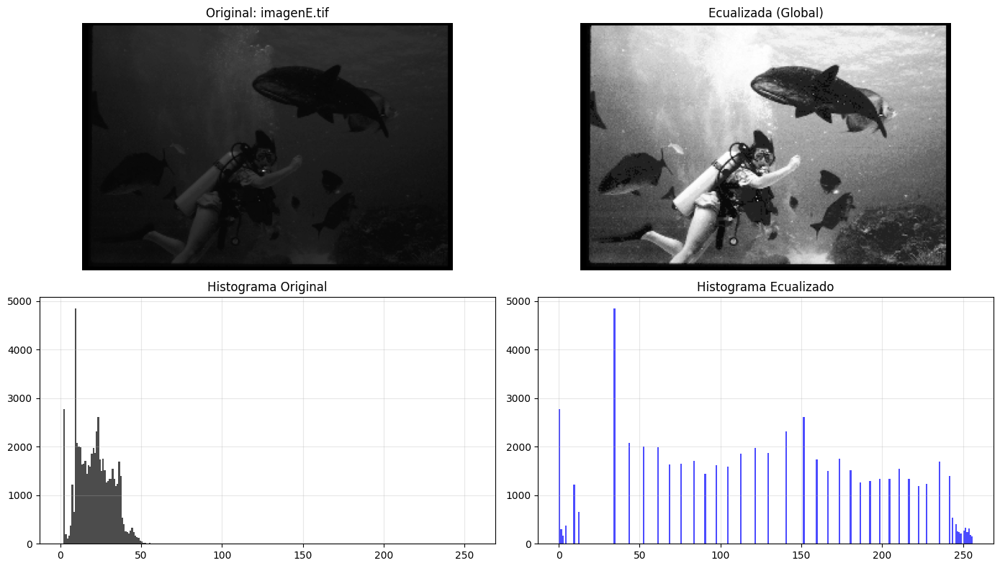

In [37]:
def ecualizar_y_mostrar(ruta):
    img = cv2.imread(ruta, cv2.IMREAD_GRAYSCALE)
    if img is None: print(f'No se encontró {ruta}'); return
    equ = cv2.equalizeHist(img)
    fig, axs = plt.subplots(2, 2, figsize=(14, 8))
    nombre = ruta.split('/')[-1]
    axs[0,0].imshow(img, cmap='gray');      axs[0,0].set_title(f'Original: {nombre}');    axs[0,0].axis('off')
    axs[0,1].imshow(equ, cmap='gray');      axs[0,1].set_title('Ecualizada (Global)');    axs[0,1].axis('off')
    axs[1,0].hist(img.ravel(), 256, [0,256], color='black', alpha=0.7); axs[1,0].set_title('Histograma Original'); axs[1,0].grid(True, alpha=0.3)
    axs[1,1].hist(equ.ravel(), 256, [0,256], color='blue',  alpha=0.7); axs[1,1].set_title('Histograma Ecualizado'); axs[1,1].grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()

for letra in ('A', 'B', 'C', 'D', 'E'):
    ecualizar_y_mostrar(f'imagen{letra}.tif')

---
## TP2b — Ejercicio 2: Aplicaciones

### 2a — Ecualización Local en `cuadros.tif`

La ecualización global falla cuando el fondo domina el histograma, ahogando los detalles minoritarios. CLAHE divide la imagen en cuadrículas y ecualiza localmente cada una.

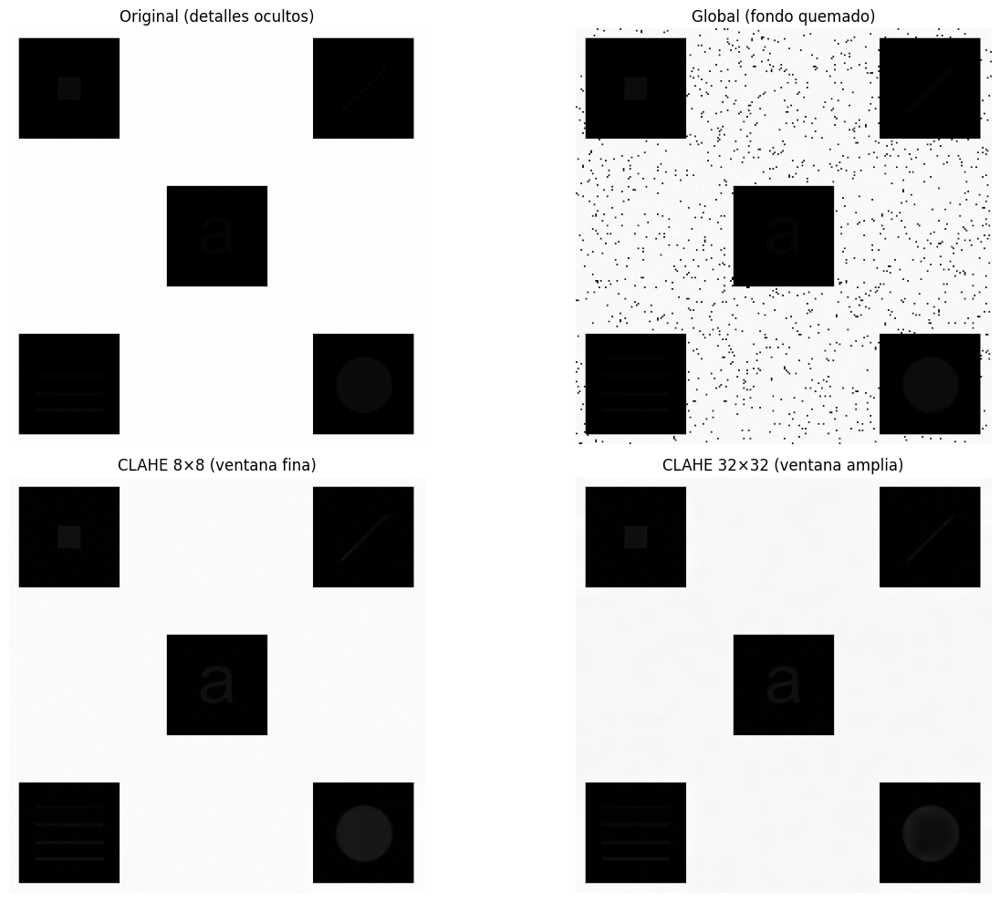

In [28]:
img_cuadros = cv2.imread('cuadros.tif', cv2.IMREAD_GRAYSCALE)

if img_cuadros is None:
    print('No se encontró cuadros.tif')
else:
    img_global = cv2.equalizeHist(img_cuadros)
    img_clahe8  = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,  8)).apply(img_cuadros)
    img_clahe32 = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(32, 32)).apply(img_cuadros)

    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    datos = [
        (img_cuadros, 'Original (detalles ocultos)'),
        (img_global,  'Global (fondo quemado)'),
        (img_clahe8,  'CLAHE 8×8 (ventana fina)'),
        (img_clahe32, 'CLAHE 32×32 (ventana amplia)'),
    ]
    for ax, (im, t) in zip(axs.flat, datos):
        ax.imshow(im, cmap='gray'); ax.set_title(t); ax.axis('off')
    plt.tight_layout(); plt.show()

### 2b — Búsqueda por Correlación de Histogramas

`cv2.compareHist` con `HISTCMP_CORREL` mide la similitud entre dos histogramas normalizados (1 = idénticos, 0 = sin correlación). La imagen desconocida se asigna a la categoría con mayor correlación.

15 imágenes encontradas.


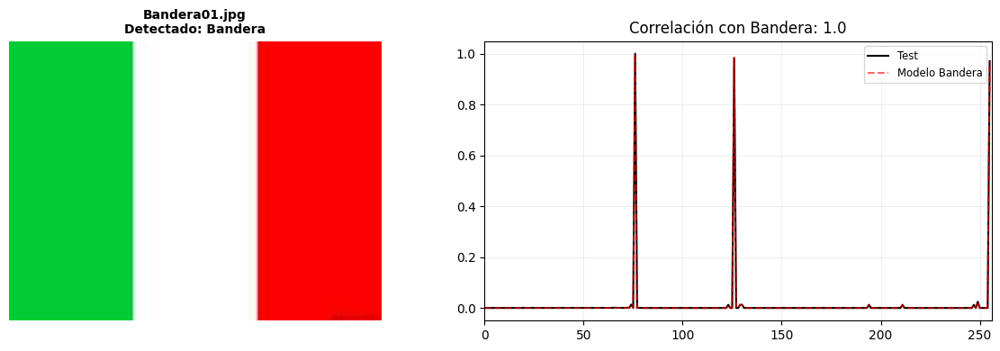

Bandera01.jpg: {'Bandera': 1.0, 'Caricaturas': 0.1111, 'Paisaje': -0.0405, 'Personaje': -0.022}
------------------------------------------------------------


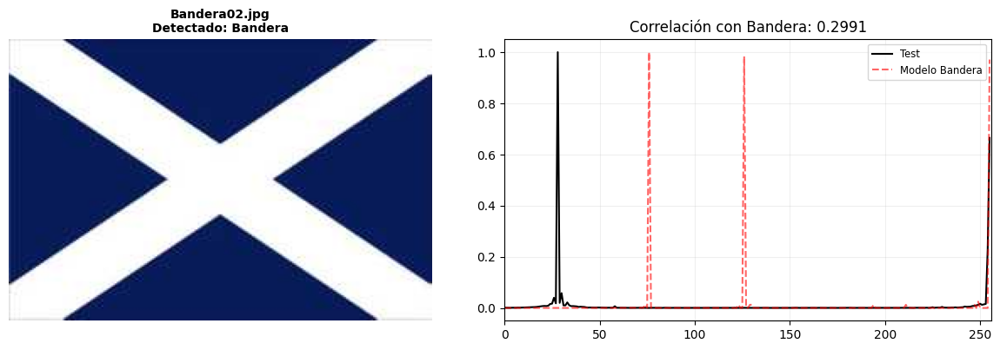

Bandera02.jpg: {'Bandera': 0.2991, 'Caricaturas': 0.2761, 'Paisaje': -0.0828, 'Personaje': -0.0168}
------------------------------------------------------------


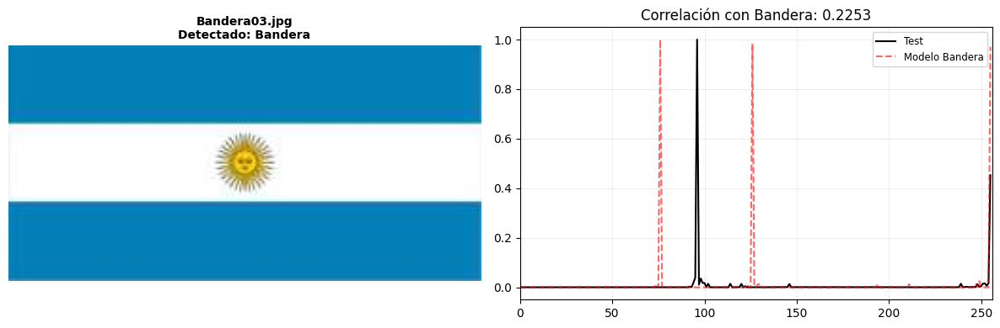

Bandera03.jpg: {'Bandera': 0.2253, 'Caricaturas': 0.102, 'Paisaje': -0.032, 'Personaje': -0.0163}
------------------------------------------------------------


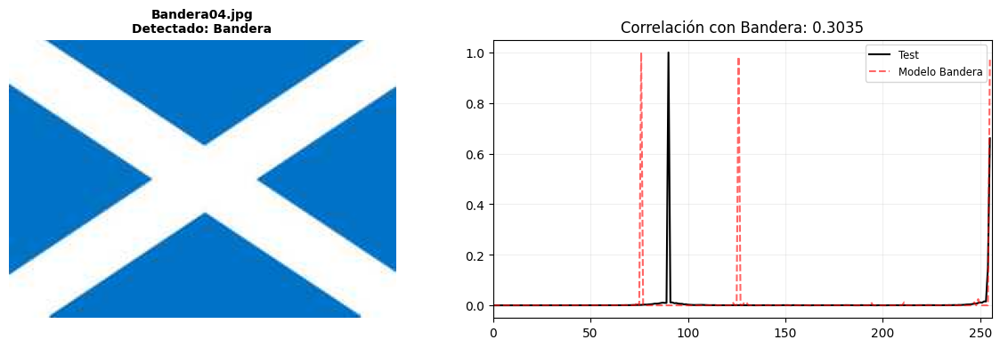

Bandera04.jpg: {'Bandera': 0.3035, 'Caricaturas': 0.2323, 'Paisaje': -0.0395, 'Personaje': -0.0197}
------------------------------------------------------------


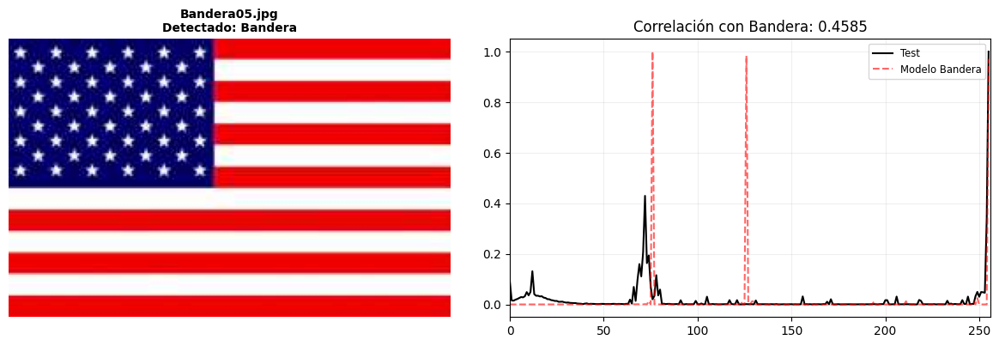

Bandera05.jpg: {'Bandera': 0.4585, 'Caricaturas': 0.4215, 'Paisaje': -0.1083, 'Personaje': 0.0112}
------------------------------------------------------------


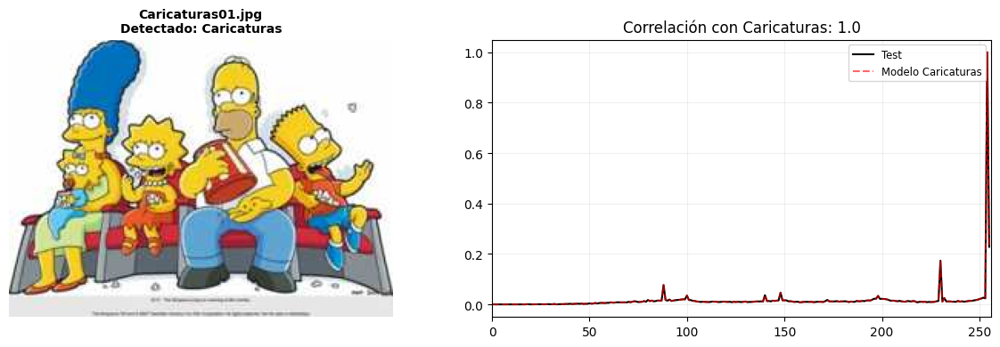

Caricaturas01.jpg: {'Bandera': 0.1111, 'Caricaturas': 1.0, 'Paisaje': -0.0119, 'Personaje': -0.0434}
------------------------------------------------------------


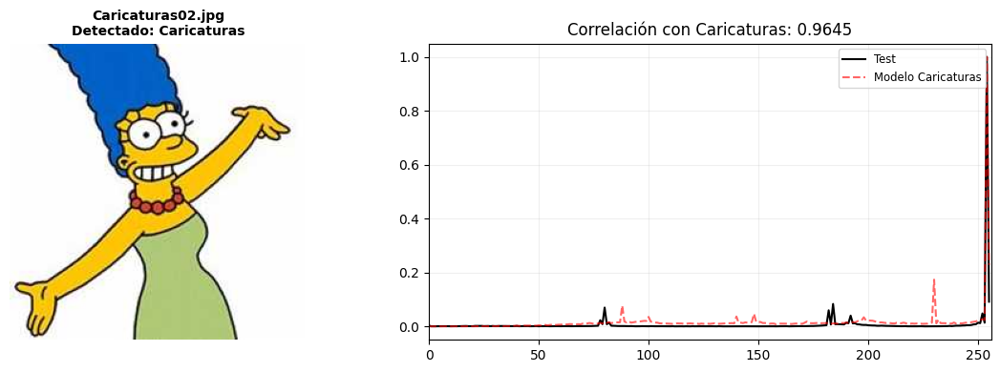

Caricaturas02.jpg: {'Bandera': 0.0405, 'Caricaturas': 0.9645, 'Paisaje': -0.0026, 'Personaje': -0.022}
------------------------------------------------------------


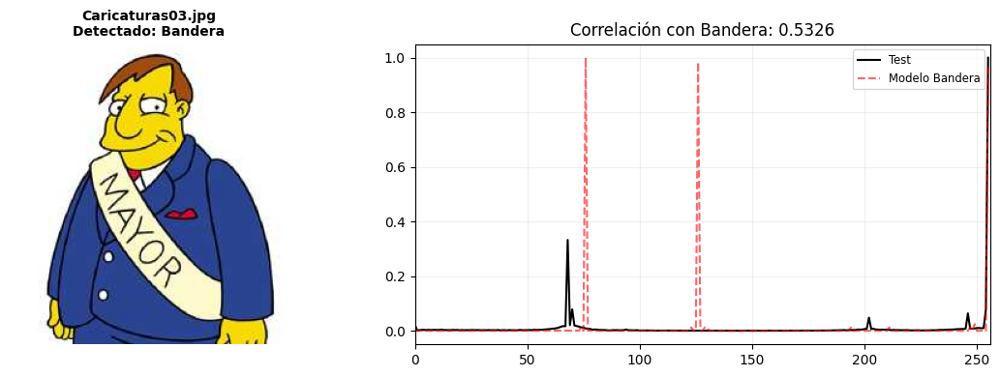

Caricaturas03.jpg: {'Bandera': 0.5326, 'Caricaturas': 0.2599, 'Paisaje': -0.0511, 'Personaje': -0.0206}
------------------------------------------------------------


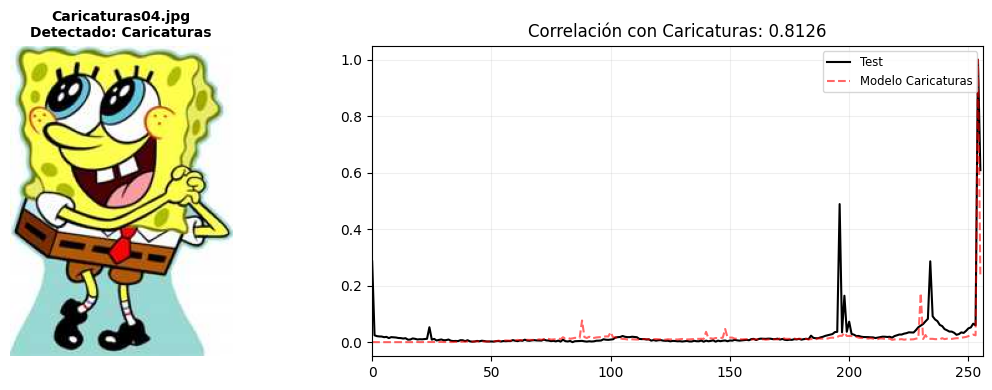

Caricaturas04.jpg: {'Bandera': 0.2328, 'Caricaturas': 0.8126, 'Paisaje': 0.0537, 'Personaje': -0.0222}
------------------------------------------------------------


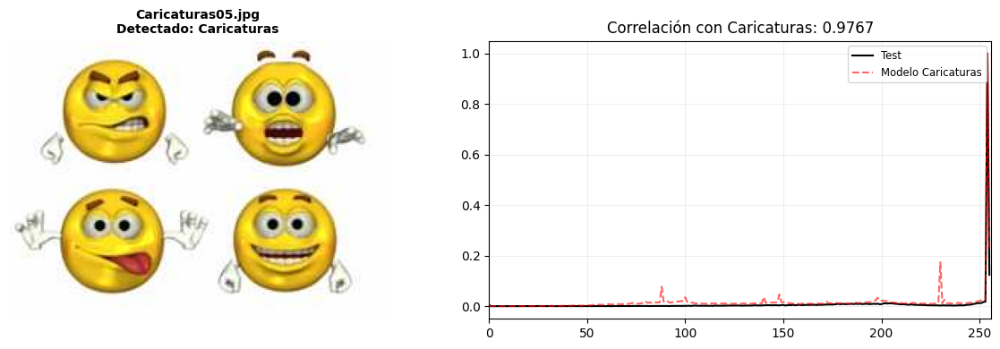

Caricaturas05.jpg: {'Bandera': 0.0588, 'Caricaturas': 0.9767, 'Paisaje': -0.0169, 'Personaje': -0.0245}
------------------------------------------------------------


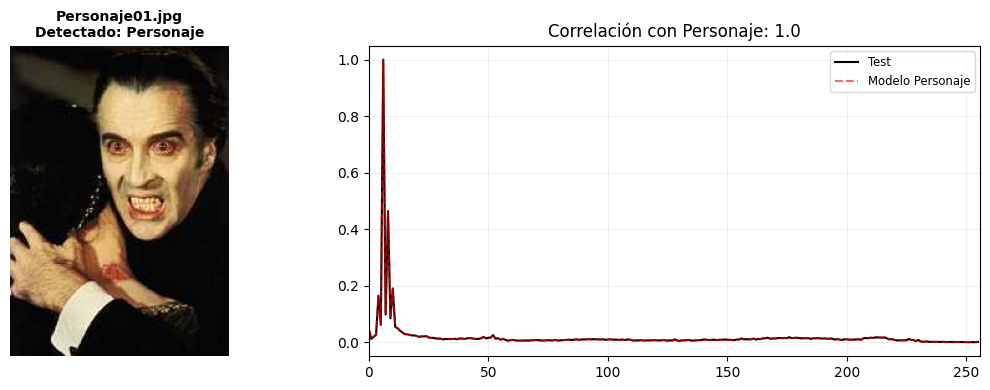

Personaje01.jpg: {'Bandera': -0.022, 'Caricaturas': -0.0434, 'Paisaje': -0.0737, 'Personaje': 1.0}
------------------------------------------------------------


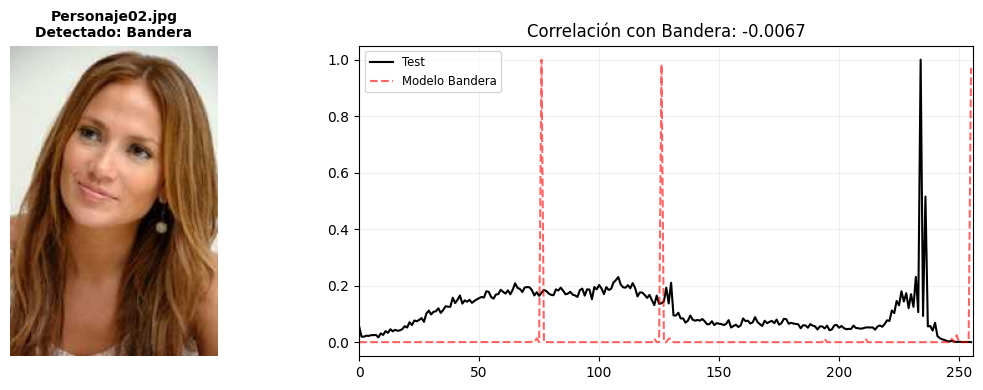

Personaje02.jpg: {'Bandera': -0.0067, 'Caricaturas': -0.0825, 'Paisaje': -0.2029, 'Personaje': -0.132}
------------------------------------------------------------


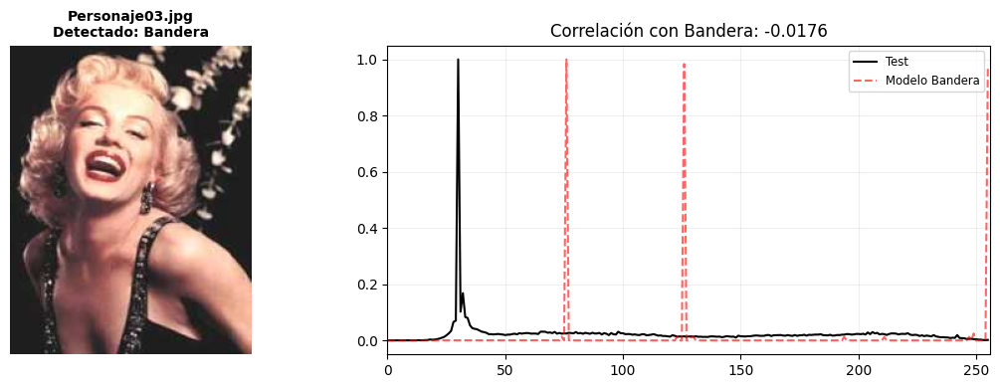

Personaje03.jpg: {'Bandera': -0.0176, 'Caricaturas': -0.0391, 'Paisaje': -0.0415, 'Personaje': -0.0418}
------------------------------------------------------------


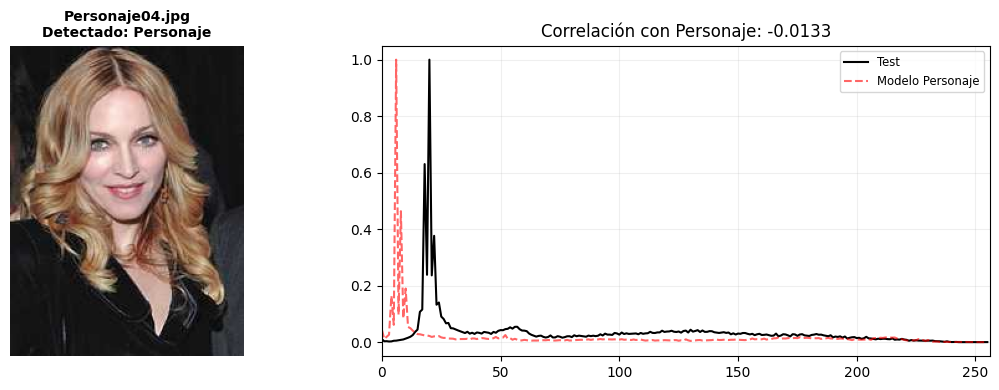

Personaje04.jpg: {'Bandera': -0.0262, 'Caricaturas': -0.0634, 'Paisaje': -0.0965, 'Personaje': -0.0133}
------------------------------------------------------------


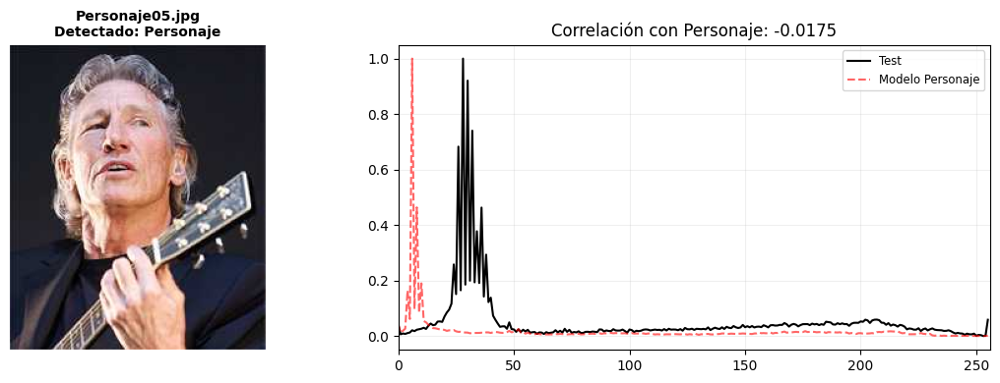

Personaje05.jpg: {'Bandera': -0.02, 'Caricaturas': -0.0606, 'Paisaje': -0.0867, 'Personaje': -0.0175}
------------------------------------------------------------


In [30]:
RUTA_BUSQUEDA = 'Busqueda_histograma/'
CATEGORIAS    = ['Bandera', 'Caricaturas', 'Paisaje', 'Personaje']
EXT           = '.jpg'

def calcular_hist_modelo(ruta):
    img = cv2.imread(ruta, cv2.IMREAD_GRAYSCALE)
    if img is None: return None
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    cv2.normalize(hist, hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    return hist

modelos = {cat: calcular_hist_modelo(f'{RUTA_BUSQUEDA}{cat}01{EXT}') for cat in CATEGORIAS}

def clasificar(ruta_test):
    h_test = calcular_hist_modelo(ruta_test)
    if h_test is None: return 'Error', {}, None
    puntajes = {cat: round(cv2.compareHist(h, h_test, cv2.HISTCMP_CORREL), 4)
                for cat, h in modelos.items() if h is not None}
    ganador = max(puntajes, key=puntajes.get)
    return ganador, puntajes, h_test

if not os.path.isdir(RUTA_BUSQUEDA):
    print(f'No se encontró la carpeta {RUTA_BUSQUEDA}')
else:
    archivos = sorted(f for f in os.listdir(RUTA_BUSQUEDA) if f.endswith(EXT))
    print(f'{len(archivos)} imágenes encontradas.')

    for nombre in archivos:
        ruta = os.path.join(RUTA_BUSQUEDA, nombre)
        resultado, puntajes, h_test = clasificar(ruta)
        if resultado == 'Error': continue

        img_test = cv2.imread(ruta)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        ax1.imshow(cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB))
        ax1.set_title(f'{nombre}\nDetectado: {resultado}', fontsize=10, fontweight='bold')
        ax1.axis('off')
        ax2.plot(h_test, color='black', label='Test')
        ax2.plot(modelos[resultado], color='red', linestyle='--', alpha=0.6, label=f'Modelo {resultado}')
        ax2.set_title(f'Correlación con {resultado}: {puntajes[resultado]}')
        ax2.set_xlim([0, 256]); ax2.legend(fontsize='small'); ax2.grid(True, alpha=0.2)
        plt.tight_layout(); plt.show()
        print(f'{nombre}: {puntajes}')
        print('-' * 60)